In [1]:
import pickle

from Bio import SeqIO
from Bio.SeqRecord import SeqRecord

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
from functions import *
import networkx as nx
from matplotlib.pyplot import figure, text
from matplotlib import gridspec

from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib import cm

import os
import datetime
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, Dense, MaxPooling1D, Flatten, GlobalAveragePooling1D, Dropout,LSTM
from tensorflow.keras.layers import Input, RepeatVector,  Masking, TimeDistributed, Lambda,Activation
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import Adagrad
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint,TensorBoard,EarlyStopping



#Building the neural network
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler

from sklearn.model_selection import train_test_split,cross_val_score,cross_val_predict

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import CountVectorizer

from sklearn.naive_bayes import MultinomialNB

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

from sklearn import metrics

from sklearn.mixture import GaussianMixture

import seaborn as sns

import re

from collections import defaultdict

from geopy.geocoders import Nominatim

from community import community_louvain

import sys

import csv

from keras.constraints import maxnorm

from keras.preprocessing import sequence

import pandas

import random

from tempfile import TemporaryFile



import pandas as pd




from mpl_toolkits.basemap import Basemap
from collections import defaultdict
import country_converter as coco


2024-05-12 22:30:02.437286: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-12 22:30:02.664643: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /shared/centos7/anaconda3/2022.05/lib:/shared/centos7/nodejs/14.15.4/lib
2024-05-12 22:30:02.664679: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-05-12 22:30:07.136398: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'

# Read the saved dataframe with month column

In [2]:
df_date=pd.read_csv('data/df_date.csv')  
months=sorted(list(set([i[:7] for i in list(df_date['Date'])])))
print(months)

start=7
start_month=months[start]
end_month=months[-1]
df_date_i=df_date[df_date["Month"] >=start]

print(start_month)
print(end_month)


centroid='England'
#centroid='France'
target='region'

Kmer=[100]
Ngram_size=[1]
padding=False

threshold=300  
sample_size=300


['2019-12', '2020-01', '2020-02', '2020-03', '2020-04', '2020-05', '2020-06', '2020-07', '2020-08', '2020-09', '2020-10', '2020-11', '2020-12', '2021-01', '2021-02', '2021-03', '2021-04', '2021-05']
2020-07
2021-05


In [3]:
def filter_df_samplelarge(data_frame,column, threshold_max,threshold_min):
    #SELECT THRESHOLD_MIN<COLUMN COUNT<THRESHOLD_MAX
    data_filter=data_frame[data_frame[column].isin(data_frame[column].value_counts()[data_frame[column].value_counts()>threshold_min].index)]
    data_filter=data_filter[data_filter[column].isin(data_filter[column].value_counts()[data_filter[column].value_counts()<threshold_max].index)]
    frames=[data_filter]
    
    for col in list(data_frame[column].value_counts()[data_frame[column].value_counts()>threshold_max].index):
        data_frame_c_=data_frame[data_frame[column]==col].groupby(column).apply (lambda x: x.sample(n=threshold_max,random_state=1))
        data_frame_c=data_frame_c_.reset_index(drop=True)
        frames.append(data_frame_c)
        
    df_processed=pd.concat(frames)
    
    return df_processed.reset_index(drop=True)



def filter_df(data_frame,column, threshold):
    return data_frame[data_frame[column].isin(data_frame[column].value_counts()[data_frame[column].value_counts()>threshold].index)]





# function to convert sequence strings into k-mer words, default size = 6 (hexamer words)

def get_metrics(y_test, y_predicted):
    accuracy = accuracy_score(y_test, y_predicted)
    precision = precision_score(y_test, y_predicted, average='weighted')
    recall = recall_score(y_test, y_predicted, average='weighted')
    f1 = f1_score(y_test, y_predicted, average='weighted')
    return accuracy, precision, recall, f1



def convert_sparse_matrix_to_sparse_tensor(X):
    coo = X.tocoo()
    indices = np.mat([coo.row, coo.col]).transpose()
    return tf.SparseTensor(indices, coo.data, coo.shape)


def leave_one_out(df,column,region_i):
    return df[df[column]!=region_i].reset_index(drop=True),df[df[column]==region_i].reset_index(drop=True)



        

# Change the month_i variable and centroid country here
# Dont need leave_one_out here, just do binary classification

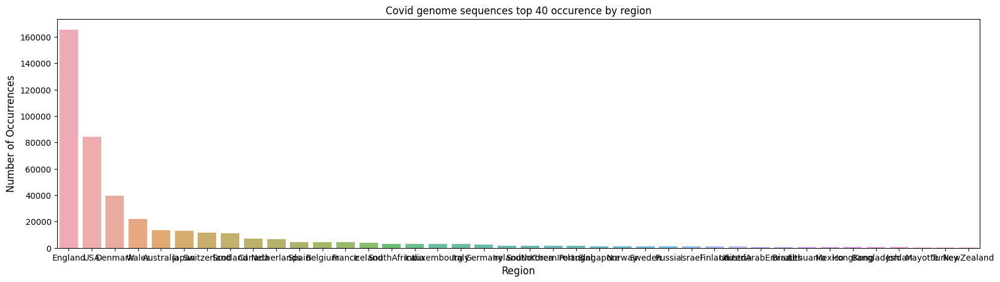

In [4]:



n_top=40
region_count  = df_date_i['region'].value_counts()
region_count = region_count[:n_top,]
plt.figure(figsize=(20,5))
sns.barplot(x=region_count.index, y=region_count.values, alpha=0.8)
plt.title('Covid genome sequences top %d occurence by region'%n_top)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Region', fontsize=12)
plt.show()

In [5]:
# evenly select sample_size number of genome sequences from each region

print(df_date_i['region'].value_counts()[:10])

df_filtered=filter_df(df_date_i,'region', threshold)
df_even_=df_filtered.groupby("region").apply (lambda x: x.sample(n=sample_size,random_state=1))
df_even=df_even_.reset_index(drop=True)
len(list(set(df_even['region'])))


region_list=list(set(df_even[target]))
region_list.remove(centroid)
print(len(region_list))

England        165407
USA             84379
Denmark         39763
Wales           21775
Australia       13371
Japan           13016
Switzerland     11512
Scotland        11005
Canada           7276
Netherlands      6436
Name: region, dtype: int64
48


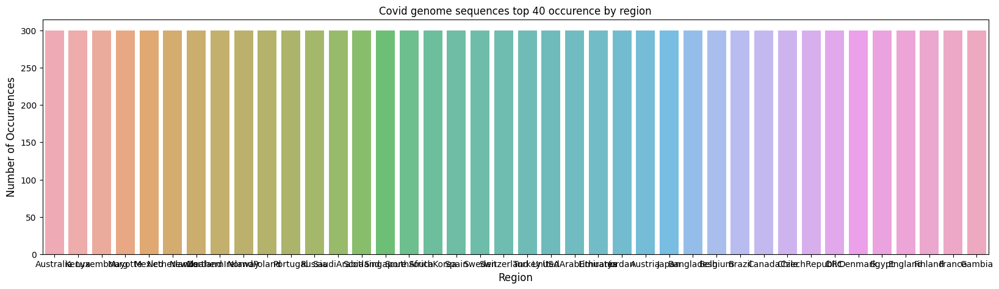

In [6]:



n_top=40
region_count  = df_even['region'].value_counts()
region_count = region_count[:n_top,]
plt.figure(figsize=(20,5))
sns.barplot(x=region_count.index, y=region_count.values, alpha=0.8)
plt.title('Covid genome sequences top %d occurence by region'%n_top)
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Region', fontsize=12)
plt.show()

## Naive bayesian

In [7]:



# function to convert sequence strings into k-mer words, default size = 6 (hexamer words)
def getKmers(sequence, size=3):
    return [sequence[x:x+size].lower() for x in range(len(sequence) - size + 1)]



def convert_sparse_matrix_to_sparse_tensor(X):
    coo = X.tocoo()
    indices = np.mat([coo.row, coo.col]).transpose()
    return tf.SparseTensor(indices, coo.data, coo.shape)




# NB binary classification 
# cross validation to assess the performance


In [8]:


    
def NB_wholedf(region_i):

    df_pair=df_even[(df_even.region==centroid)|(df_even.region==region_i)]
    df_pair=df_pair.reset_index(drop=True)
    data=df_pair

    Y_NB_Kmer_Ngram=[[] for i in range(len(Kmer))]
    Accuracy=[[] for i in range(len(Kmer))]
    


    for i,kmer_i in enumerate(Kmer):
        for ngram_size in Ngram_size:
            genome = data
            genome['words'] = genome.apply(lambda x: getKmers(x['sequence'],size=kmer_i), axis=1)
            genome = genome.drop('sequence', axis=1)
            genome_texts = list(genome['words'])
            for item in range(len(genome_texts)):
                genome_texts[item] = ' '.join(genome_texts[item])
            y = genome[target]
            cv = CountVectorizer(ngram_range=(ngram_size,ngram_size))
            X = cv.fit_transform(genome_texts)
            NB = MultinomialNB(alpha=0.1)
            y_NB=cross_val_predict(NB, X, y, cv=5)
            scores=cross_val_score(NB, X, y, cv=5)

            df = pd.DataFrame({'Region_i':[region_i]*len(y),'True_Labels': y, 'Predicted_Labels': y_NB})

    return (df,scores)


In [9]:
import time
from multiprocessing import Pool


n_proc=50
list_inputs=region_list

if __name__ == "__main__":
    start = time.perf_counter()
    with Pool(n_proc) as p:   
        results=p.map(NB_wholedf, list_inputs)
    print(f"Elapsed time: {round(time.perf_counter() - start, 2)}")      

Elapsed time: 92.56


# output include the predicted labels and true labels in a dataframe. And the mean and s.d. of the cross validation results

In [10]:
cv_scores_dict=defaultdict()
for i,region_i in enumerate(region_list):
    (globals()[f"df_{region_i}"],scores)=results[i]
    mean_score = np.mean(scores)
    std_dev_score = np.std(scores)
    cv_scores_dict[region_i]=(mean_score,std_dev_score)

In [11]:
cv_scores_df=pd.DataFrame(cv_scores_dict)
row_names = ['mean', 's.d.']
cv_scores_df = pd.DataFrame(cv_scores_dict, index=row_names)
print('mean',np.mean(cv_scores_df.loc['mean']))
print('s.d.',np.mean(cv_scores_df.loc['s.d.']))

mean 0.895
s.d. 0.022865741054588298


# visuals

In [12]:
# format long, lat

def region_format_for_here(list_of_places):
    new_list=[]
    for i in list_of_places:
        if i=='USA':
            new_list.append('United States')
        elif i=='CzechRepublic':
            new_list.append('Czechia')
        elif i=='DRC':
            new_list.append('Democratic Republic of the Congo')
        elif i=='Korea, Republic of':
            new_list.append('South Korea')
        elif i=='Russian Federation':
            new_list.append('Russia')
        elif i=='Czech Republic':
            new_list.append('Czechia')            
        elif i=='Gambia':
            new_list.append('The Gambia')
        elif i=='Macedonia, the former Yugoslav Republic of':
            new_list.append('North Macedonia')
        elif i=='Taiwan, Province of China':
            new_list.append('Taiwan')    
        elif i=='Venezuela, Bolivarian Republic of':
            new_list.append('Venezuela')               
        elif i=='Iran, Islamic Republic of':
            new_list.append('Iran')    
        elif i=='Viet Nam':
            new_list.append('Vietnam')    
        elif i.upper()==i:
            new_list.append(i)
        else:
            new_list.append(' '.join(re.findall('[A-Z][^A-Z]*',i)))
    
    new_new_list=[]#remove double splitting
    for i in new_list:
        new_new_list.append(' '.join(i.split()))
    
    return new_new_list

In [13]:


region_geo = {
    'Argentina': (-63.6167, -38.4161),
    'Brazil': (-51.9253, -14.2350),
    'Chile': (-71.5420, -35.6751),
    'Ghana': (-1.0232, 7.9465),
    'Israel': (34.8516, 31.0461),
    'Nigeria': (8.6753, 9.0820),
    'United States': (-95.7129, 37.0902),
    'Uganda': (32.2903, 1.3733),
    #'All': (0.0000, 0.0000), # Placeholder for 'All'
    'Aruba': (-69.9683, 12.5211),
    'Hungary': (19.5033, 47.1625),
    'Australia': (133.7751, -25.2744),
    'Austria': (14.5501, 47.5162),
    'Belgium': (4.4699, 50.5039),
    'Denmark': (9.5018, 56.2639),
    'Iceland': (-19.0208, 64.9631),
    'Ireland': (-8.2439, 53.4129),
    'Northern Ireland': (-6.4923, 54.7877),
    'Spain': (-3.7492, 40.4637),
    'Bahrain': (50.5577, 26.0667),
    'Bangladesh': (90.3563, 23.6849),
    'Egypt': (30.8025, 26.8206),
    'France': (2.2137, 46.2276),
    'Germany': (10.4515, 51.1657),
    'Hong Kong': (114.1095, 22.3964),
    'India': (78.9629, 20.5937),
    'Indonesia': (113.9213, -0.7893),
    'Mozambique': (35.5296, -18.6657),
    'Netherlands': (5.2913, 52.1326),
    'North Macedonia': (21.7453, 41.6086),
    'Norway': (8.4689, 60.4720),
    'Senegal': (-14.4524, 14.4974),
    'Singapore': (103.8198, 1.3521),
    'Slovenia': (14.9955, 46.1512),
    'South Africa': (22.9375, -30.5595),
    'South Korea': (127.7669, 35.9078),
    'Sri Lanka': (80.7718, 7.8731),
'Switzerland': (8.2275, 46.8182),
'United Arab Emirates': (53.8478, 23.4241),
'New Zealand': (174.8859, -40.9006),
'Romania': (24.9668, 45.9432),
'Russia': (105.3188, 61.5240),
'Thailand': (100.9925, 15.8700),
'Turkey': (35.2433, 38.9637),
'Luxembourg': (6.1296, 49.8153),
'Mayotte': (45.1662, -12.8275),
'Portugal': (-8.2245, 39.3999),
'Canada': (-106.3468, 56.1304),
'Colombia': (-74.2973, 4.5709),
'French Guiana': (-53.1258, 3.9339),
'Italy': (12.5674, 41.8719),
'Peru': (-75.0152, -9.1900),
'Sweden': (18.6435, 60.1282),
'Costa Rica': (-83.7534, 9.7489),
'Czechia': (15.4729, 49.8175),
'England': (-1.1743, 52.3555),
'Rwanda': (29.8739, -1.9403),
'Equatorial Guinea': (10.2679, 1.6508),
'Lithuania': (23.8813, 55.1694),
'Democratic Republic of the Congo': (21.7587, -4.0383),
'Gambia': (-15.3101, 13.4432),
'Mexico': (-102.5528, 23.6345),
'Poland': (19.1451, 51.9194),
'Zambia': (27.8493, -13.1339),
'Ecuador': (-78.1834, -1.8312),
'Finland': (25.7482, 61.9241),
'Scotland': (-4.2026, 56.4907),
'Slovakia': (19.6990, 48.6690),
'Wales': (-3.7837, 52.1307),
'Kenya': (37.9062, -0.0236),
'Gibraltar': (-5.3536, 36.1408),
'Latvia': (24.6032, 56.8796),
'Japan': (138.2529, 36.2048),
'Saudi Arabia': (45.0792, 23.8859),
'Jordan': (36.2384, 30.5852),
'Malaysia': (101.9758, 4.2105)
}

region_geo.update({
    'Luxembourg': (6.1296, 49.8153),
    'Mayotte': (45.1662, -12.8275),
    'Portugal': (-8.2245, 39.3999),
    'Canada': (-106.3468, 56.1304),
    'Colombia': (-74.2973, 4.5709),
    'French Guiana': (-53.1258, 3.9339),
    'Italy': (12.5674, 41.8719),
    'Peru': (-75.0152, -9.1900),
    'Sweden': (18.6435, 60.1282),
    'Costa Rica': (-83.7534, 9.7489),
    'Czechia': (15.4729, 49.8175),
    'England': (-1.1743, 52.3555),
    'Rwanda': (29.8739, -1.9403),
    'Equatorial Guinea': (10.2679, 1.6508),
    'Lithuania': (23.8813, 55.1694),
    'Democratic Republic of the Congo': (21.7587, -4.0383),
    'The Gambia': (-15.3101, 13.4432),
    'Mexico': (-102.5528, 23.6345),
    'Poland': (19.1451, 51.9194),
    'Zambia': (27.8493, -13.1339),
    'Ecuador': (-78.1834, -1.8312),
    'Finland': (25.7482, 61.9241),
    'Scotland': (-4.2026, 56.4907),
    'Slovakia': (19.6990, 48.6690),
    'Wales': (-3.7837, 52.1307),
    'Kenya': (37.9062, -0.0236),
    'Gibraltar': (-5.3536, 36.1408),
    'Latvia': (24.6032, 56.8796),
    'Japan': (138.2529, 36.2048),
    'Saudi Arabia': (45.0792, 23.8859),
    'Jordan': (36.2384, 30.5852),
    'Malaysia': (101.9758, 4.2105)
})


In [14]:
region_names=list(cv_scores_df.columns)
region_names_formatted=region_format_for_here(region_names)   
degrees=[(1-i)*100 for i in list(cv_scores_df.loc['mean'])]
degree_dict_formatted=dict(zip(region_names_formatted,degrees))


In [15]:
region_names=list(cv_scores_df.columns)
region_names_formatted=region_format_for_here(region_names)   
degrees=[(1-i)*100 for i in list(cv_scores_df.loc['mean'])]
degree_dict_formatted=dict(zip(region_names_formatted,degrees))
centroid_formatted=region_format_for_here([centroid])[0]

degree_dict_formatted[centroid_formatted]=max(degree_dict_formatted.values())
print(centroid_formatted)


England


In [19]:
annotate_size=40


# Only plot the world map

/tmp/ipykernel_9869/696271827.py:33: MatplotlibDeprecationWarning: Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  patches = [Polygon(np.array(shape), True)]
/tmp/ipykernel_9869/696271827.py:50: MatplotlibDeprecationWarning: Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  patches = [Polygon(np.array(shape), True)]


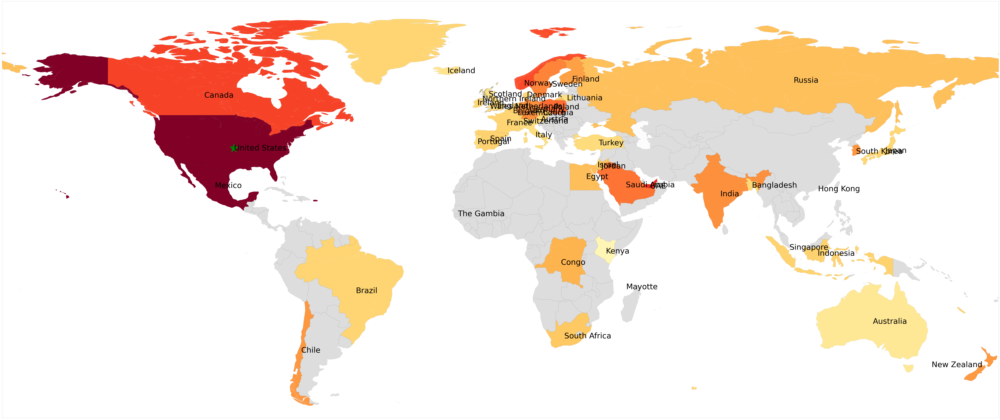

In [92]:
colourmap = 'YlOrRd'


fig = plt.figure(num=None, figsize=(80, 30))
ax1 = fig.add_subplot(111, facecolor='w', frame_on=True)
#ax1.set_title('Global', fontsize=30)

cmap = cm.get_cmap(colourmap)

num_colors = len(degree_dict_formatted)
deg_max = sorted(degree_dict_formatted.values(), reverse=True)[1]  # greatest degree excluding degree of the hub
scheme = {i: cmap(degree_dict_formatted[i] / deg_max) for i in list(degree_dict_formatted.keys())}
bins = np.linspace(1, 29, num_colors)

# map 1: sovereignty level
m = Basemap(llcrnrlon=-179, llcrnrlat=-60, urcrnrlon=179, urcrnrlat=90, resolution='l')
m.drawmapboundary(fill_color='white', linewidth=0.1)
m.fillcontinents(color='#f2f2f2', alpha=0.7)
m.drawcoastlines(linewidth=0.1, color="white")
m.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)

colored_region = []

for info, shape in zip(m.units_info, m.units):
    name_en = info['SUBUNIT']
    if name_en not in list(degree_dict_formatted.keys()):
        color = '#dddddd'
    else:
        color = scheme[name_en]
        colored_region.append(name_en)

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax1.add_collection(pc)

    
    


m.drawmapboundary(fill_color='white', linewidth=0.1)
m.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

    
for info, shape in zip(m.units_info, m.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax1.add_collection(pc)


ax1.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)

for i in list(degree_dict_formatted.keys()):
    if i=='New Zealand':
        ax1.annotate(i, xy=m(region_geo[i][0]-20, region_geo[i][1]), size=annotate_size, verticalalignment='center')
    elif i=='United Arab Emirates':
        ax1.annotate('UAE', xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')
    elif i=='Democratic Republic of the Congo':
        ax1.annotate('Congo', xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')
    else:
        ax1.annotate(i, xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')

    
    
    '''  
for i in uncolored_final:
    ax1.plot(m(region_geo[i][0],region_geo[i][1])[0],m(region_geo[i][0],region_geo[i][1])[1], color = scheme[i], marker="o", markersize=50)

'''

state = np.random.RandomState(51423)

#fig.suptitle('Target Label = %s, threshold=%d, sample size=%d' % (centroid_formatted, threshold, sample_size),x=0.51, y=0.2, fontsize=45)

#m4 = ax1.pcolormesh(state.rand(0, 0), cmap=colourmap)

#plt.colorbar(m4, shrink=0.5)
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)


path=f'figures/Binary_NB/BinaryNB_cv5fold_centroid{centroid}_threshold{threshold}_sample_size{sample_size}_kmer{Kmer[0]}_{start_month}---{end_month}_world.png'
print(path)
fig.savefig(path,bbox_inches='tight',dpi=300)

plt.show()


# plotly

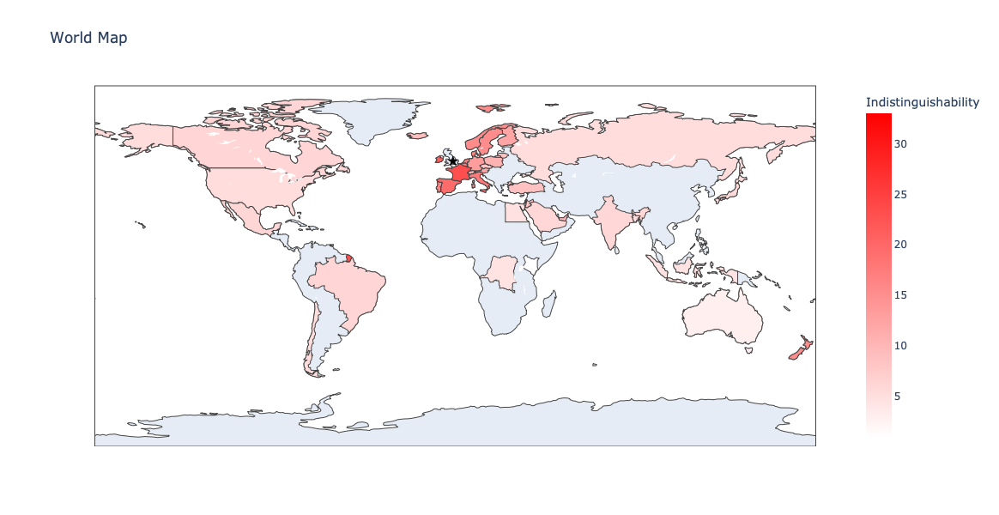

In [17]:
import plotly.graph_objects as go


color_scale = [
    [0, 'rgb(255,255,255)'], 
    [1, 'rgb(255,0,0)'] 
]

annotations = [{'text': region, 'x': region_geo[region][0], 'y': region_geo[region][1]} for region in region_names_formatted]

fig = go.Figure(data=go.Choropleth(
    locations=region_names, 
    z=degrees, 
    locationmode='country names',  
    colorscale=color_scale, 
    colorbar_title='Indistinguishability',  
))


star_trace = go.Scattergeo(
    lon=[region_geo[centroid][0]],
    lat=[region_geo[centroid][1]],
    mode='markers',
    marker=dict(
        size=10,
        symbol='star',
        color='black'
    ),
    name=centroid,
    showlegend=False
)



for annotation in annotations:
    fig.add_annotation(
        text=annotation['text'],
        x=annotation['x'],
        y=annotation['y'],
        showarrow=False,
        font=dict(size=15),
    )

fig.add_trace(star_trace)
fig.update_layout(
    title_text='World Map',  # Title of the plot
    geo=dict(
        showcoastlines=True,  # Show coastlines
        projection_type='equirectangular'  # Projection type
    ),
    width=1000,  # Width of the figure in pixels
    height=600,  # Height of the figure in pixels
)

# Show the plot
fig.show()


# europe zoom in + world map

In [16]:
degree_dict_formatted[centroid]

32.99999999999999

/tmp/ipykernel_25799/1887935550.py:43: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1887935550.py:60: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1887935550.py:126: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1887935550.py:143: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.



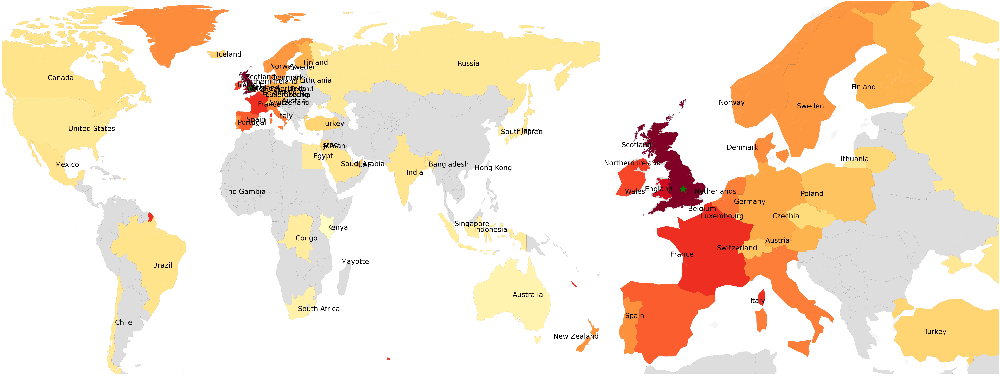

In [20]:

#new version


colourmap='YlOrRd'





fig = plt.figure(num=None, figsize=(80, 30) ) 
spec = gridspec.GridSpec(ncols=2, nrows=1,width_ratios=[1.5, 1], wspace=0,hspace=0, height_ratios=[1])
 


ax1 = fig.add_subplot(spec[0], facecolor='w', frame_on=True )


#ax1.set_title('Global',fontsize=60)
cmap = cm.get_cmap(colourmap)

num_colors = len(degree_dict_formatted)
deg_max = sorted(degree_dict_formatted.values(), reverse=True)[0] 
scheme = {i: cmap(degree_dict_formatted[i] / deg_max) for i in list(degree_dict_formatted.keys())}
bins = np.linspace(1, 29, num_colors)

# map 1: sovereignty level
m = Basemap(llcrnrlon=-130, llcrnrlat=-55, urcrnrlon=179, urcrnrlat=85, resolution='l')
m.drawmapboundary(fill_color='white', linewidth=0.1)
m.fillcontinents(color='#f2f2f2', alpha=0.7)
m.drawcoastlines(linewidth=0.1, color="white")
m.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)

colored_region = []

for info, shape in zip(m.units_info, m.units):
    name_en = info['SUBUNIT']
    if name_en not in list(degree_dict_formatted.keys()):
        color = '#dddddd'
    else:
        color = scheme[name_en]
        colored_region.append(name_en)

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax1.add_collection(pc)


    
# map 3: UK country level

m.drawmapboundary(fill_color='white', linewidth=0.1)
m.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

    
for info, shape in zip(m.units_info, m.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax1.add_collection(pc)


    
    


ax1.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)

for i in list(degree_dict_formatted.keys()):
    if i=='New Zealand':
        ax1.annotate(i, xy=m(region_geo[i][0]-20, region_geo[i][1]), size=annotate_size, verticalalignment='center')
    elif i=='United Arab Emirates':
        ax1.annotate('UAE', xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')
    elif i=='Democratic Republic of the Congo':
        ax1.annotate('Congo', xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')

    else:
        ax1.annotate(i, xy=m(region_geo[i][0], region_geo[i][1]), size=annotate_size, verticalalignment='center')


state = np.random.RandomState(51423)


m4 = ax1.pcolormesh(state.rand(0, 0), cmap=colourmap)


#---------------------------------------------------------------------------------------------------------------------------------------------------------

ax2 = fig.add_subplot(122, facecolor='w', frame_on=True)

#ax2.set_title('Europe Zoom-In',fontsize=60) 


cmap = cm.get_cmap(colourmap)


#description = 'Europe'





m2=Basemap(llcrnrlon=-12, llcrnrlat=30, urcrnrlon=40, urcrnrlat=75, resolution='l')
m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.fillcontinents(color='#f2f2f2', alpha=0.7)
m2.drawcoastlines(linewidth=0.1, color="white")
m2.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)





for info, shape in zip(m2.units_info, m2.units):
    name_en = info['SUBUNIT']
    if name_en not in list(degree_dict_formatted.keys()):
        color = '#dddddd'

    else:
        color = scheme[name_en]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax2.add_collection(pc)

    
# map 3: UK country level


m2=Basemap(llcrnrlon=-12, llcrnrlat=35, urcrnrlon=40, urcrnrlat=70, resolution='l')
m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

for info, shape in zip(m2.units_info, m2.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax2.add_collection(pc)

    
    


    
ax2.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)



for i in list(degree_dict_formatted.keys()):
    ax2.annotate(i, xy=m(region_geo[i][0]-5, region_geo[i][1]), size=annotate_size, verticalalignment='center')



state = np.random.RandomState(51423)

#fig.suptitle('Target Label = %s, threshold=%d, sample size=%d'%(region_leave_out_formatted,threshold,sample_size),x=0.51,y=0.2,fontsize=45)


ax1.set_aspect('auto', adjustable='datalim')
ax2.set_aspect('auto', adjustable='datalim')



plt.show
plt.subplots_adjust(left=0, right=1, top=1, bottom=0)


path=f'figures/Binary_NB/BinaryNB_cv5fold_centroid{centroid}_threshold{threshold}_sample_size{sample_size}_kmer{Kmer[0]}_{start_month}---{end_month}.png'

#fig.savefig(path,bbox_inches='tight',dpi=300)






In [161]:
Kmer

[100]

# configuration

In [21]:
degrees=list(degree_dict_formatted.values())
for i in range(100):
    np.random.shuffle(degrees)
permuted_degrees=degrees
permuted_degrees.remove(max(degrees)) # remove the degree of the centroid region
non_centroid_regions=list(degree_dict_formatted.keys())
non_centroid_regions.remove(centroid_formatted)

permuted_degree_dict_formatted=defaultdict()
for i in range(len(non_centroid_regions)):
    permuted_degree_dict_formatted[non_centroid_regions[i]]=permuted_degrees[i]
permuted_degree_dict_formatted[centroid_formatted]=1

/tmp/ipykernel_25799/2287968413.py:40: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/2287968413.py:95: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/2287968413.py:112: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.



<function matplotlib.pyplot.show(close=None, block=None)>

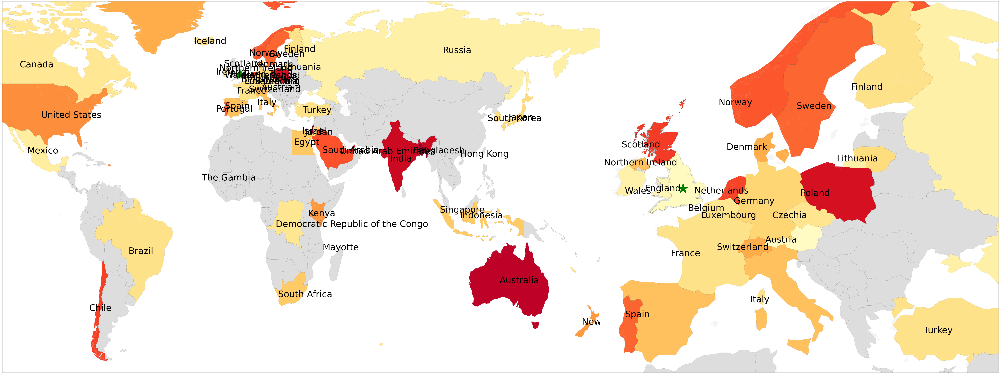

In [22]:

#new version


colourmap='YlOrRd'





fig = plt.figure(num=None, figsize=(80, 30) ) 
spec = gridspec.GridSpec(ncols=2, nrows=1,width_ratios=[1.5, 1], wspace=0,hspace=0, height_ratios=[1])
 


ax1 = fig.add_subplot(spec[0], facecolor='w', frame_on=True )
cmap = cm.get_cmap(colourmap)

num_colors = len(permuted_degree_dict_formatted)
deg_max = sorted(permuted_degree_dict_formatted.values(), reverse=True)[1]  # greatest degree excluding degree of the hub
scheme = {i: cmap(permuted_degree_dict_formatted[i] / deg_max) for i in list(permuted_degree_dict_formatted.keys())}
bins = np.linspace(1, 29, num_colors)

# map 1: sovereignty level
m = Basemap(llcrnrlon=-120, llcrnrlat=-60, urcrnrlon=179, urcrnrlat=80, resolution='l')
m.drawmapboundary(fill_color='white', linewidth=0.1)
m.fillcontinents(color='#f2f2f2', alpha=0.7)
m.drawcoastlines(linewidth=0.1, color="white")
m.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)

colored_region = []

for info, shape in zip(m.units_info, m.units):
    name_en = info['SUBUNIT']
    if name_en not in list(permuted_degree_dict_formatted.keys()):
        color = '#dddddd'
    else:
        color = scheme[name_en]
        colored_region.append(name_en)

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax1.add_collection(pc)



ax1.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)

for i in list(permuted_degree_dict_formatted.keys()):
    ax1.annotate(i, xy=m(region_geo[i][0]-5, region_geo[i][1]), size=annotate_size, verticalalignment='center')

#ax1.set_title('Global', fontsize=30)

state = np.random.RandomState(51423)


m4 = ax1.pcolormesh(state.rand(0, 0), cmap=colourmap)


#---------------------------------------------------------------------------------------------------------------------------------------------------------

ax2 = fig.add_subplot(122, facecolor='w', frame_on=True)

#ax2.set_title('Europe Zoom-In',fontsize=60) 


cmap = cm.get_cmap(colourmap)







m2=Basemap(llcrnrlon=-12, llcrnrlat=35, urcrnrlon=40, urcrnrlat=70, resolution='l')
m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.fillcontinents(color='#f2f2f2', alpha=0.7)
m2.drawcoastlines(linewidth=0.1, color="white")
m2.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)





for info, shape in zip(m2.units_info, m2.units):
    name_en = info['SUBUNIT']
    if name_en not in list(permuted_degree_dict_formatted.keys()):
        color = '#dddddd'

    else:
        color = scheme[name_en]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax2.add_collection(pc)

    
# map 3: UK country level



m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

for info, shape in zip(m2.units_info, m2.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax2.add_collection(pc)

    
    


    
ax2.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)



for i in list(permuted_degree_dict_formatted.keys()):
    ax2.annotate(i, xy=m(region_geo[i][0]-5, region_geo[i][1]), size=annotate_size, verticalalignment='center')



state = np.random.RandomState(51423)

#fig.suptitle('Target Label = %s, threshold=%d, sample size=%d'%(region_leave_out_formatted,threshold,sample_size),x=0.51,y=0.2,fontsize=45)



ax1.set_aspect('auto', adjustable='datalim')
ax2.set_aspect('auto', adjustable='datalim')

path=f'figures/Binary_NB/BinaryNB_cv5fold_centroid{centroid}_threshold{threshold}_sample_size{sample_size}_kmer{Kmer[0]}_{start_month}---{end_month}_config_world.png'


fig.savefig(path,bbox_inches='tight',dpi=300)


plt.show







/tmp/ipykernel_25799/1382047152.py:46: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1382047152.py:63: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1382047152.py:131: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.

/tmp/ipykernel_25799/1382047152.py:148: MatplotlibDeprecationWarning:

Passing the closed parameter of __init__() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.



<function matplotlib.pyplot.show(close=None, block=None)>

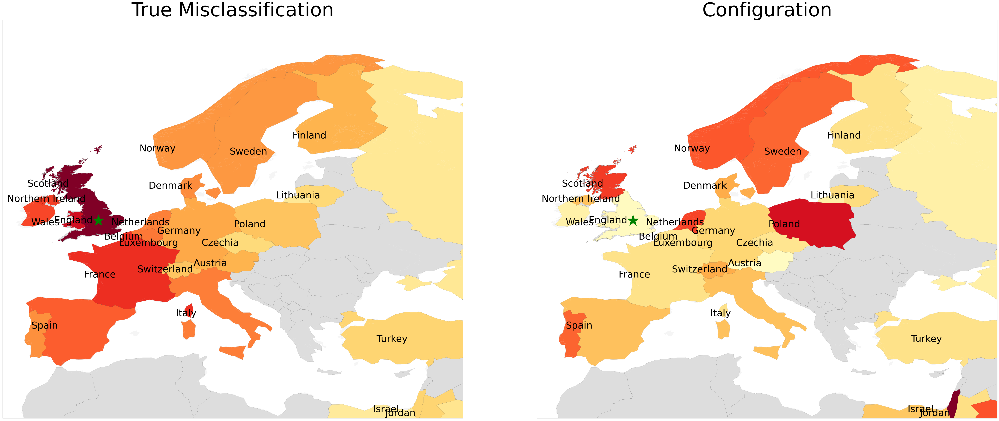

In [23]:

#new version


colourmap='YlOrRd'
ax1title_fontsize=80
ax2title_fontsize=80


num_colors = len(degree_dict_formatted)
deg_max = sorted(degree_dict_formatted.values(), reverse=True)[1]  # greatest degree excluding degree of the hub
scheme = {i: cmap(degree_dict_formatted[i] / deg_max) for i in list(degree_dict_formatted.keys())}
bins = np.linspace(1, 29, num_colors)


fig = plt.figure(num=None, figsize=(80, 30) ) 
spec = gridspec.GridSpec(ncols=2, nrows=1,width_ratios=[1, 1], wspace=0,hspace=0, height_ratios=[1])
 


ax1 = fig.add_subplot(spec[0], facecolor='w', frame_on=True )


cmap = cm.get_cmap(colourmap)




m2=Basemap(llcrnrlon=-12, llcrnrlat=30, urcrnrlon=40, urcrnrlat=75, resolution='l')
m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.fillcontinents(color='#f2f2f2', alpha=0.7)
m2.drawcoastlines(linewidth=0.1, color="white")
m2.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)





for info, shape in zip(m2.units_info, m2.units):
    name_en = info['SUBUNIT']
    if name_en not in list(degree_dict_formatted.keys()):
        color = '#dddddd'

    else:
        color = scheme[name_en]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax1.add_collection(pc)

    
# map 3: UK country level



m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

for info, shape in zip(m2.units_info, m2.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax1.add_collection(pc)

    
    


    
ax1.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)



for i in list(degree_dict_formatted.keys()):
    ax1.annotate(i, xy=m(region_geo[i][0]-5, region_geo[i][1]), size=annotate_size, verticalalignment='center')



ax1.set_title('True Misclassification', fontsize=ax1title_fontsize)

state = np.random.RandomState(51423)


m4 = ax1.pcolormesh(state.rand(0, 0), cmap=colourmap)


#---------------------------------------------------------------------------------------------------------------------------------------------------------
num_colors = len(permuted_degree_dict_formatted)
deg_max = sorted(permuted_degree_dict_formatted.values(), reverse=True)[1]  # greatest degree excluding degree of the hub
scheme = {i: cmap(permuted_degree_dict_formatted[i] / deg_max) for i in list(permuted_degree_dict_formatted.keys())}
bins = np.linspace(1, 29, num_colors)

ax2 = fig.add_subplot(122, facecolor='w', frame_on=True)


ax2.set_title('Configuration',fontsize=ax2title_fontsize) 


cmap = cm.get_cmap(colourmap)


description = 'Europe'





m2=Basemap(llcrnrlon=-12, llcrnrlat=30, urcrnrlon=40, urcrnrlat=75, resolution='l')
m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.fillcontinents(color='#f2f2f2', alpha=0.7)
m2.drawcoastlines(linewidth=0.1, color="white")
m2.readshapefile('data/ne_110m_admin_0_sovereignty/ne_110m_admin_0_sovereignty', name='units', linewidth=0.1)





for info, shape in zip(m2.units_info, m2.units):
    name_en = info['SUBUNIT']
    if name_en not in list(permuted_degree_dict_formatted.keys()):
        color = '#dddddd'

    else:
        color = scheme[name_en]

    patches = [Polygon(np.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax2.add_collection(pc)

    
# map 3: UK country level



m2.drawmapboundary(fill_color='white', linewidth=0.1)
m2.readshapefile('data/GBR_adm/GBR_adm1', name='units', linewidth=0.1)

for info, shape in zip(m2.units_info, m2.units):
    name_en = info['NAME_1']
    if name_en in list(set(['Wales','Scotland','England','Northern Ireland'])):
        color = scheme[name_en]
        patches = [Polygon(np.array(shape), True)]
        pc = PatchCollection(patches)
        pc.set_facecolor(color)
        ax2.add_collection(pc)

    
    


    
ax2.plot(m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[0],
          m(region_geo[centroid_formatted][0], region_geo[centroid_formatted][1])[1],
          color='g', marker="*", markersize=50)



for i in list(permuted_degree_dict_formatted.keys()):
    ax2.annotate(i, xy=m(region_geo[i][0]-5, region_geo[i][1]), size=annotate_size, verticalalignment='center')



state = np.random.RandomState(51423)

#fig.suptitle('Target Label = %s, threshold=%d, sample size=%d'%(region_leave_out_formatted,threshold,sample_size),x=0.51,y=0.2,fontsize=45)

path=f'figures/Binary_NB/BinaryNB_cv5fold_centroid{centroid}_threshold{threshold}_sample_size{sample_size}_kmer{Kmer[0]}_{start_month}---{end_month}_config.png'


fig.savefig(path,bbox_inches='tight',dpi=300)

plt.show





